In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import pandas as pd 
import numpy as np
from scipy import linalg
from scipy import stats

from sklearn.cross_decomposition import PLSRegression
from sklearn.model_selection import train_test_split

import matplotlib.pyplot as plt

import mahalanobis as maha

#### Read the dataset

In [3]:
# Original data file on cluster: 'share/data/analyses/jonne/COVID-COMBO/ImageMedianFeatures/ImageMedianPlateAllPlatesAnnotatedQC.parquet' 

df = pd.read_parquet('data/covid_combo.parquet')

#### Preprocessing specific to this particular data set

In [4]:
df.drop(columns=['compound_name'], inplace=True)

In [5]:
nan_rows = df[df['ImageNumber_cells'].isna()]
df.drop(nan_rows.index, inplace=True)
df.reset_index(inplace=True, drop=True)

In [6]:
df['type'] = 'treated'

infected = (~df['Metadata_Well'].str.contains('08|16')) & (df['cbkid'] == '[dmso]')
uninfected = (df['Metadata_Well'].str.contains('08|16')) & (df['cbkid'] == '[dmso]')
df.loc[infected, 'type'] = 'infected'
df.loc[uninfected, 'type'] = 'uninfected'

In [7]:
# Create a column 'pair_id': batch_id of the second compound in each combination

combos = (df['pert_type'] == 'covid-combo')
df_combos = df[combos].copy()

# Dict for mapping
image_to_batch_id = df_combos.groupby('ImageID', as_index=False).agg({'batch_id': frozenset})
mapping = pd.Series(
    image_to_batch_id['batch_id'].values, index=image_to_batch_id['ImageID']
).to_dict()
# New column with a set of two batch_id's in the combination
df_combos['pair_ids'] = df_combos['ImageID'].map(mapping)

# Select the opposite batch_id from 'pair_ids'
def find_pair(this_id, pair_ids):
    pair_id = set(pair_ids).difference(set([this_id,]))
    return ''.join(pair_id)

df['pair_batch_id'] = 'single'    # dummy value
df.loc[combos, 'pair_batch_id'] = df_combos.apply(lambda x: find_pair(x['batch_id'], x['pair_ids']), axis=1)

In [8]:
# New column to store 'combo_id', unique for each combination, based on the same set in 'pair_ids'
combinations = set(df_combos['pair_ids'])
mapping = {pair: count for count, pair in enumerate(combinations)}  # dict for mapping

df_combos['combo_id'] = df_combos['pair_ids'].map(mapping).astype('int')

df['combo_id'] = -1     # dummy value for infected (DMSO) cells
df.loc[combos, 'combo_id'] = df_combos['combo_id']

In [9]:
# Remove the redundant columns related to experiment settings

experiment_info_cols = {
    'ImageID',
    'Metadata_AcqID',
    'Metadata_AcqID_cells',
    'Metadata_AcqID_cytoplasm',
    'Metadata_Barcode',
    'Metadata_Site',
    'Metadata_Site_cells',
    'Metadata_Site_cytoplasm',
    'Metadata_Well',
    'barcode',
    'cell_line',
    'painted',
    'plateWell',
    'seeded',
    'solvent',
    'treatment',
    'compound_name',
    'well_id',
    'plate', 'plate-name', 'site', 'size', 'plate_type', 'treatment_units',
    'painted_type', 'layout_id', 'stock_conc', 'pert_type', 'cmpd_vol',
    'well_vol', 'cells_per_well', 'batchid', 'cbkid', 'libid', 'libtxt',
    'smiles', 'inchi', 'inkey',
}

df.drop(columns=experiment_info_cols.intersection(df.columns), inplace=True)

In [10]:
# 'Meta' columns = non-morpgological features

meta_cols = {
    'batch_id',
    'combo_id',
    'type',
    'pair_batch_id',
    'cmpd_conc',
    'Count_nuclei',
    'ImageNumber_nuclei',
    'ObjectNumber_nuclei',
}

In [11]:
# Omit 'uninfected' from the set for predictions
df_cells = df[df['type'] != 'uninfected']
x_cells = df_cells.drop(
    columns=set(meta_cols).intersection(df.columns)
).copy()

In [12]:
df_control = df[df['type'].isin(['uninfected', 'infected'])].copy()
df_control.reset_index(inplace=True, drop=True)

X = df_control.drop(
    columns=set(meta_cols).intersection(df_control.columns)
).copy()

y = np.where(df_control['type'] == 'infected', 0, 1)

PLS-DA allows to identify the drugs with too low effect – by comparing positive and negative control (non-infectected vs DMSO)

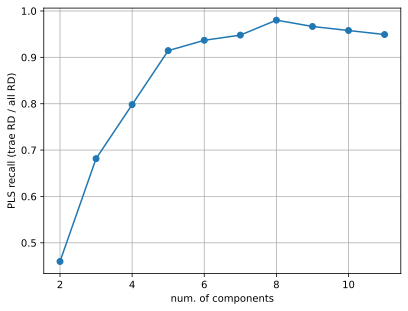

In [13]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)

recall = {}
for n_components in range(2, 12):
    pls = PLSRegression(n_components, scale=False)
    pls.fit(X_train, y_train)
    y_pred = pls.predict(X_test) > 0.5
    recall[n_components] = np.count_nonzero((y_pred == y_test) & (y_test == 1)) / np.count_nonzero(y_test == 1)

plt.plot(recall.keys(), recall.values(), marker='o')
plt.xlabel('num. of components')
plt.ylabel('PLS recall (trae RD / all RD)')

plt.grid()
plt.show()

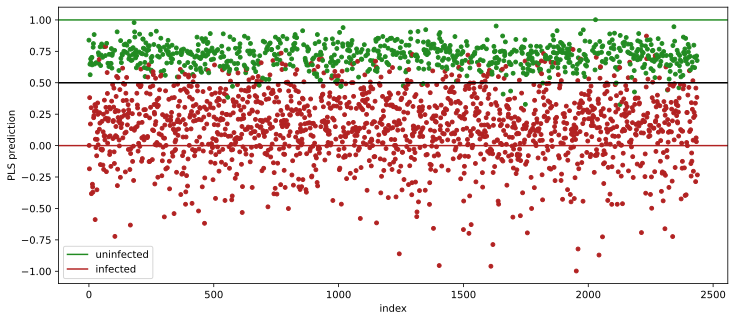

In [14]:
pls = PLSRegression(n_components=8, scale=False)
pls.fit(X_train, y_train)
y_pred = pls.predict(X_test)

fig = plt.figure(figsize = (12,5))
ax = fig.add_subplot(111) 
ax.set_xlabel('index', fontsize=10)
ax.set_ylabel('PLS prediction', fontsize=10)
colors = ['forestgreen' if y_i == 1 else 'firebrick' for y_i in y_test]
plt.axhline(1, c='forestgreen', label='uninfected')
plt.axhline(0, c='firebrick', label='infected')
plt.axhline(0.5, c='k')
ax = plt.scatter(range(len(X_test)), pls.predict(X_test), c=colors, s=15)
plt.legend()

plt.show()

In [15]:
pls_pred = pls.predict(x_cells)
df_pls = pd.DataFrame(pls_pred, columns=['pls'])

#### Whitening and Mahalanobis distance

In [16]:
# There are some methods in literature that allow to automatically select the optimal number of components from PCA
# We employ one such method below: 'svht' from mahalanobis.py

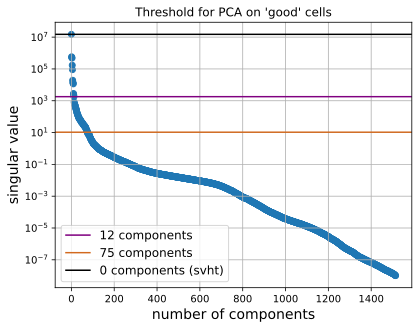

In [17]:
df_good = df[df['type'] == 'uninfected'].copy()
# morphological profile of uninfected cells ('good')
x_good = df_good.drop(
    columns=set(meta_cols).intersection(df.columns)
).to_numpy()

cov_matrix = np.cov(x_good, rowvar=False)
sigma, u = linalg.eigh(cov_matrix, check_finite=True)
rank = min(*x_good.shape) - 1
sigma = sigma[::-1]
# remove values under ~float precision
too_low = len(sigma[sigma>1e-8])
rank = min(rank, too_low)

plt.scatter(range(rank), sigma[:rank])

# manual threshold = 10^3
thresh = sigma[sigma >= 10**3][-1]
n_comp = int(np.where(sigma == thresh)[0][0])
plt.axhline(thresh, c='purple', label=f'{n_comp} components')

# manual threshold = 10
thresh = sigma[sigma >= 10][-1]
n_comp = int(np.where(sigma == thresh)[0][0])
plt.axhline(thresh, c='chocolate', label=f'{n_comp} components')

# optimal threshold for the PCA of 'good' cells
thresh = int(maha.svht(x_good))
plt.axhline(sigma[thresh], c='k', label=f'{thresh} components (svht)')

plt.grid()
plt.yscale('log')
plt.legend(fontsize=12)
plt.xlabel('number of components', fontsize=14)
plt.ylabel('singular value', fontsize=14)
plt.title("Threshold for PCA on 'good' cells")
plt.show()

In [18]:
n_components = 20  # we use # components sufficient to make uninfected and infected cells distinguishable
df_good = df[df['type'] == 'uninfected'].copy()
x_good = df_good.drop(
    columns=set(meta_cols).intersection(df.columns)
).copy()

dist_pred = maha.get_distance(x_good, x_cells, n_components=n_components)
df_dist = pd.DataFrame(dist_pred, columns=['distance'])

proba_pred = maha.get_proba(x_good, x_cells, n_components=n_components)
df_proba = pd.DataFrame(proba_pred, columns=['proba'])

#### Concatenate predictions


In [19]:
predictions = pd.concat(
    [
        df_cells[
            ['type', 'batch_id', 'combo_id', 'cmpd_conc', 'pair_batch_id']
        ].reset_index(drop=True), 
        df_pls, 
        df_dist,
        df_proba,
    ], 
    axis=1,
)

predictions.head()

,type,batch_id,combo_id,cmpd_conc,pair_batch_id,pls,distance,proba
0,treated,BJ1897713,599,0.83,BJ1894563,0.603442,5.791953,0.029360
1,treated,BJ1897713,599,0.83,BJ1894563,0.609161,4.330608,0.537853
2,treated,BJ1897713,599,0.83,BJ1894563,0.383626,6.797415,0.000755
3,treated,BJ1897713,599,0.83,BJ1894563,-0.086787,11.569555,0.000000
4,treated,BJ1897713,599,0.83,BJ1894563,0.188568,7.230271,0.000104


#### Ranking all compounds by distance

Rows in the ranking below correspond to different compounds at different concentrations, i.e., we average over replicates.

In [20]:
def quantile(n):
    def quantile_(x):
        return x.quantile(n)
    quantile_.__name__ = f'q_{n*100:.0f}'
    return quantile_

selected_columns = predictions[[
    'batch_id',
    'combo_id',
    'type',
    'pair_batch_id',
    'cmpd_conc',
    # 'Count_nuclei',
    'pls',
    'distance',
    'proba',
]].copy()

# Aggregate replicates
average_predictions = selected_columns.groupby(by=['batch_id', 'combo_id', 'cmpd_conc', 'type', 'pair_batch_id'], as_index=False).agg({
        # 'Count_nuclei': 'median', 
        'pls': [quantile(.25), quantile(.75), 'median'],
        'distance': [quantile(.25), quantile(.75), 'median'],
        'proba': [quantile(.25), quantile(.75), 'median'],
})

# Rename columns
custom_columns = [''.join(col) for col in average_predictions.columns.to_flat_index() if not col[1]]
custom_columns += ['_'.join(col) for col in average_predictions.columns.to_flat_index() if col[1]]
average_predictions.columns = custom_columns

# Sort by distance to non-infected
average_predictions.sort_values(by=['distance_median'], ascending=True, inplace=True)

# Quantiles are written as plus/minus to the median
average_predictions['distance_q_75'] = average_predictions['distance_q_75'] - average_predictions['distance_median']
average_predictions['distance_q_25'] =  average_predictions['distance_median'] - average_predictions['distance_q_25']
average_predictions['proba_q_75'] = average_predictions['proba_q_75'] - average_predictions['proba_median']
average_predictions['proba_q_25'] =  average_predictions['proba_median'] - average_predictions['proba_q_25']

average_predictions.reset_index(inplace=True, drop=True)
average_predictions.to_csv("output/Covid_combo_ranked.csv", sep=';', index=False)
average_predictions.head(5)

,batch_id,combo_id,cmpd_conc,type,pair_batch_id,pls_q_25,pls_q_75,pls_median,distance_q_25,distance_q_75,distance_median,proba_q_25,proba_q_75,proba_median
0,BJ1898404,86,3.33,treated,BJ1895608,0.663294,0.718866,0.705535,0.403468,0.614385,3.828973,0.317260,0.133529,0.791393
1,BJ1895591,236,10.00,treated,BJ1897675,0.629192,0.726676,0.688524,0.234842,0.439216,4.080727,0.244050,0.112537,0.675413
2,BJ1898163,2,3.33,treated,BJ1895296,0.476515,0.680007,0.587043,0.448275,1.115747,4.139892,0.522644,0.206526,0.642263
3,BJ1894340,429,10.00,treated,BJ1896186,0.684129,0.727190,0.707844,0.027491,0.139651,4.167063,0.077829,0.014922,0.629200
4,BJ1894559,171,10.00,treated,BJ1895013,0.647424,0.731902,0.703038,0.185162,0.389665,4.180199,0.217677,0.096917,0.621892


In [21]:
def plot_compounds_separately(compounds, negative=None, n_components=None, metric='distance'):

    if n_components is None:
        raise ValueError("Please, specify the number of components used in Mahalanobis distance computation")

    y_metric = f"{metric}_median"
    y_metric_q_25 = f"{metric}_q_25"
    y_metric_q_75 = f"{metric}_q_75"

    drugs = compounds[compounds['type'] == 'treated']

    conf_intervals = [0.5, 0.75]
    healthy_left = dict()
    healthy_right = dict()
    for conf in conf_intervals:
        if metric == 'distance':
            left_sq, right_sq = stats.chi2.interval(confidence=conf, df=n_components)
            healthy_left[conf], healthy_right[conf] = np.sqrt(left_sq), np.sqrt(right_sq)        
        elif metric == 'proba':
            healthy_left[conf],  healthy_right[conf] = conf, 1
        
    if negative is not None:
        # neg_median = negative[y_metric].iloc[0]
        neg_left = negative[y_metric].iloc[0] - negative[y_metric_q_25].iloc[0]
        neg_right = negative[y_metric].iloc[0] + negative[y_metric_q_75].iloc[0]

    if metric == 'distance':
        ymin, ymax = min(healthy_left.values()), neg_right + 1
    elif metric == 'proba':
        ymin, ymax = 0, 1

    cols = 4
    rows = 46

    fig, axs = plt.subplots(rows, cols, figsize=(4*cols, 3*rows))
    fig.tight_layout()

    batch_ids = drugs['batch_id'].unique()
    for r in range(rows):
        for c in range(cols):
            i = r * 4 + c
            batch_id = batch_ids[i]
            combo_ids = drugs[drugs['batch_id'] == batch_id]['combo_id'].unique()
            drug_concentrations = set()
            for combo_id in combo_ids:
                compound = drugs[(drugs['batch_id'] == batch_id) & (drugs['combo_id'] == combo_id)]
                sort_arg = np.argsort(compound['cmpd_conc'])

                conc = compound['cmpd_conc'].to_numpy()[sort_arg]
                y_values = compound[y_metric].to_numpy()[sort_arg]
                y_perc_25 = compound[y_metric_q_25].to_numpy()[sort_arg]
                y_perc_75 = compound[y_metric_q_75].to_numpy()[sort_arg]
                # axs[r, c].plot(
                #     conc, y_values, 
                #     # label=f'combination id: {combo_id}'
                # )
                axs[r, c].errorbar(
                    conc, y_values, yerr=[y_perc_25, y_perc_75], 
                    capsize=2, elinewidth=1.5, #fmt='o-', 
                    label=f'combination id: {combo_id}'
                )
                drug_concentrations = drug_concentrations.union(set(conc))

            x_ticks = list(drug_concentrations)
            
            # Uninfected cells - confidence intervals
            for i, conf in enumerate(conf_intervals):
                label = "Non-infected" if i == 0 else None
                axs[r, c].fill_between(x_ticks, healthy_left[conf], healthy_right[conf], 
                                color='royalblue', alpha=0.5*(1-conf)**0.5, 
                                zorder=1, label=label
                    )
            axs[r, c].text(
                (x_ticks[0]+x_ticks[-1])/2, (healthy_left[conf]+healthy_right[conf])/2, 
                'Non-infected', ha='center', va='center', alpha=0.4
            )
            
            # Negative state (DMSO)
            axs[r, c].fill_between(
                x_ticks, neg_left, neg_right, 
                color='k', alpha=0.25, zorder=1,
            )
            axs[r, c].text(
                (x_ticks[0]+x_ticks[-1])/2, (neg_left+neg_right)/2,
                'DMSO', ha='center', va='center', alpha=0.4,
            )

            axs[r, c].set_title(compound['name'].iloc[0])
            axs[r, c].set_xticks(x_ticks)
            # axs[r, c].set_xscale('log')
            axs[r, c].set_ylim(ymin, ymax)
            if c == 0:
                axs[r, c].set_ylabel(f'{metric}')
            if r == rows - 1:
                axs[r, c].set_xlabel('concentration')

    fig.savefig(f"output/Covid-combo-{metric}.png", dpi=300, bbox_inches="tight")


In [22]:
compounds = average_predictions.copy()
compounds['conc'] = average_predictions['cmpd_conc']

negative = compounds[compounds['type'] == 'infected'].copy()    # infected & non-treated
compounds = compounds[compounds['type'] == 'treated']

In [23]:
# If we want to use batch_id's as compound identifiers
compounds['name'] = compounds['batch_id']
compounds['pair_name'] = compounds['pair_batch_id']

In [24]:
# If we want to use compound names instead of batch_id's
with open("data/id_to_name.txt", 'r') as file:
    table = file.readlines()
id_to_name = {}
for i, line in enumerate(table):
    id_, name = line.rstrip().split('\t')
    id_to_name[id_] = name

def fill_missing_name(batch_id):
    if batch_id in id_to_name:
        return id_to_name[batch_id]
    else:
        return f"Batch_id: {batch_id}"

compounds['name'] = compounds['batch_id'].map(fill_missing_name)
compounds['pair_name'] = compounds['pair_batch_id'].map(fill_missing_name)

In [25]:
plot_compounds_separately(compounds, negative, n_components)

In [26]:
plot_compounds_separately(compounds, negative, n_components, metric='proba')

In [27]:
# # Run this cell to install the library for interactive graphs

# !pip3 install plotly
# !pip3 install --upgrade nbformat

In [28]:
import plotly.express as px


def plot_one_compound(compounds, batch_id, negative=None, n_components=None, metric='distance'):

    if n_components is None:
        raise ValueError("Please, specify the number of components used in Mahalanobis distance computation")

    y_metric = f"{metric}_median"
    y_metric_q_25 = f"{metric}_q_25"
    y_metric_q_75 = f"{metric}_q_75"

    compound = compounds[compounds['batch_id'] == batch_id]

    fig = px.line(
        compound.sort_values(by="cmpd_conc"), x="cmpd_conc", y=y_metric,
        color='pair_name',
        # color='combo_id',
        width=800, height=400, markers=True,
        error_y=y_metric_q_75, error_y_minus=y_metric_q_25,
        # category_orders={'pair_name': compounds['pair_name']},
    )

    # Healthy cells - confidence intervals
    for i, conf in enumerate([0.5, 0.75]):
        label = dict(
            text="Uninfected", font=dict(size=15, color="black"), textposition="middle left"
        ) if i == 0 else None

        if metric == 'distance':
            left, right = stats.chi2.interval(confidence=conf, df=n_components)
            left, right = np.sqrt(left), np.sqrt(right)
            
        elif metric == 'proba':
            left, right = conf, 1

        fig.add_hrect(
            type="rect",
            y0=left, y1=right,
            fillcolor="royalblue", opacity=0.8*(1-conf)**0.5,
            layer="below", line_width=0, label=label
        )

    # Negative state (DMSO)
    if negative is not None:
        conc = range(0, 31, 1)
        median = negative[y_metric].iloc[0]
        neg_left = median - negative[y_metric_q_25].iloc[0]
        neg_right = median + negative[y_metric_q_75].iloc[0]
        fig.add_hrect(
            type="rect",
            y0=neg_left, y1=neg_right,
            fillcolor="grey", opacity=0.25,
            layer="below", line_width=0,
            label=dict(
                text="DMSO", font=dict(size=15, color="black"), textposition="middle left"
            )
        )

    if metric == 'distance':
        if negative is not None:
            ymin, ymax = left, neg_right + 1
        else:
            ymin, ymax = left, max(compound[y_metric]+compound[y_metric_q_75])
    elif metric == 'proba':
        ymin, ymax = 0, 1

    conc = np.unique(compounds['cmpd_conc'])
    fig.update_xaxes(title_text="concentration", gridcolor='lightgrey', type="log", tickvals=conc)
    if metric == 'distance':
        # fig.update_yaxes(title_text='distance', gridcolor='lightgrey', type="log", tickvals=[1, 5, 10, 100], range=[ymin, ymax])
        fig.update_yaxes(title_text='distance', gridcolor='lightgrey', range=[ymin, ymax])
    elif metric == 'proba':
        fig.update_yaxes(title_text='probability', gridcolor='lightgrey', tickvals=[1, 5, 10, 100])

    fig.update_layout(
        title_text=compound['name'].iloc[0],
        plot_bgcolor='white',
        legend_title="Pair",
    )

    fig.show()


In [29]:
sel_batch_id = 'BJ1895013'  # 'BJ1895608'
# sel_batch_id = 'DO8167002'    # anti-viral

plot_one_compound(compounds, batch_id=sel_batch_id, negative=negative, n_components=n_components)

In [30]:
plot_one_compound(compounds, batch_id=sel_batch_id, negative=negative, n_components=n_components, metric='proba')